In [ ]:
###Fatemeh Karimnezhad

In [3]:
###importing libraries
import pandas as pd
import numpy as np
import matplotlib 
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import plotly.express as px
from mpl_toolkits.Basemap import Basemap

In [ ]:
###calling our data
df=pd.read_csv('NYC.csv')
df.isnull().sum()

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [4]:
df.drop(['id','host_id','latitude','longitude'],axis=1).describe()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [5]:
###deleting columns that aren't needed for analizing
df=df.drop(['last_review'],axis=1)


In [6]:
###filling empty cells with mean
df['reviews_per_month']=df.groupby(['neighbourhood_group'])['reviews_per_month'].transform(lambda x:x.fillna(x.mean()))
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  reviews_per_month               

In [7]:
df.isnull().sum()

id                                 0
name                              16
host_id                            0
host_name                         21
neighbourhood_group                0
neighbourhood                      0
latitude                           0
longitude                          0
room_type                          0
price                              0
minimum_nights                     0
number_of_reviews                  0
reviews_per_month                  0
calculated_host_listings_count     0
availability_365                   0
dtype: int64

In [8]:
df=df.dropna()
#df.info()
df.drop(['id','host_id','latitude','longitude'],axis=1).describe()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48858.000000,48858.000000,48858.000000,48858.000000,48858.000000,48858.000000
mean,152.740309,7.012444,23.273098,1.371445,7.148369,112.801425
std,240.232386,20.019757,44.549898,1.501187,32.964600,131.610962
min,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,69.000000,1.000000,1.000000,0.280000,1.000000,0.000000
50%,106.000000,3.000000,5.000000,1.220000,1.000000,45.000000
75%,175.000000,5.000000,24.000000,1.837831,2.000000,227.000000
max,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [9]:
x=df.groupby(['neighbourhood_group'])['price'].median()

In [10]:
#neighbour=pd.get_dummies(df['neighbourhood_group'])
#df=df.join(neighbour)


In [11]:
###detecting outliers, using iqr

def outlier_det(x):
    outliers=[]
    q1 = df[x].quantile(0.25)
    q3 = df[x].quantile(0.75)
    iqr = q3-q1
    Lower = q1 - 1.5 * iqr
    Upper = q3 + 1.5 * iqr
    for i in df[x]:
        if i > Upper or i < Lower:
            outliers.append(i)
    return outliers

print(outlier_det('price'))


[375, 800, 500, 350, 400, 475, 350, 500, 500, 390, 575, 500, 350, 349, 349, 650, 599, 395, 495, 375, 451, 450, 500, 350, 400, 2000, 500, 429, 350, 350, 399, 438, 700, 400, 850, 349, 599, 495, 760, 375, 485, 350, 1300, 402, 800, 385, 450, 499, 500, 387, 350, 3000, 549, 350, 500, 350, 395, 1300, 500, 380, 450, 350, 385, 499, 349, 800, 349, 350, 350, 375, 450, 500, 399, 700, 500, 400, 1000, 700, 350, 433, 595, 349, 2000, 355, 550, 380, 900, 399, 425, 495, 350, 375, 625, 350, 575, 400, 500, 600, 390, 350, 350, 465, 349, 340, 4000, 500, 400, 400, 349, 495, 999, 800, 339, 500, 2500, 890, 399, 349, 400, 650, 350, 349, 420, 950, 575, 350, 550, 499, 1000, 499, 350, 1395, 425, 395, 650, 550, 1000, 750, 499, 1000, 350, 350, 350, 350, 595, 390, 350, 399, 1500, 1899, 399, 465, 350, 495, 800, 450, 350, 5000, 349, 345, 390, 600, 1100, 550, 350, 420, 600, 380, 1200, 350, 440, 439, 555, 400, 450, 390, 700, 799, 475, 455, 420, 400, 345, 550, 1700, 525, 600, 399, 499, 350, 450, 450, 650, 750, 399, 499, 1

In [12]:
## replacing with median in each neighbourhood_group

def group_med(y):
    new=[]
    for i in df[y]:
        if i in outliers:
            new.append(np.nan)
        else:
            new.append(i)
    df[y]=new
    df[y]=df.groupby(['neighbourhood_group'])[y].transform(lambda x:x.fillna(x.median()))    
    return df[y]

outliers= outlier_det('price') 
df['price']=group_med('price')

outliers= outlier_det('minimum_nights') 
df['minimum_nights']=group_med('minimum_nights')

df['number_of_reviews']=df['number_of_reviews'].fillna(0)

In [13]:
#######now our data is ready to analize.

In [14]:
df2=df.drop(['name','host_name','neighbourhood_group','room_type','neighbourhood' ,'id','host_id','longitude','latitude'],axis=1)
df3= df2.corr()
df3

#it shows that the corralation between these features is less than 0.7; not strong enough.

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
price,1.000000,0.047657,-0.028027,-0.035647,0.163695,0.064578
minimum_nights,0.047657,1.000000,-0.100902,-0.199959,-0.060395,-0.117667
number_of_reviews,-0.028027,-0.100902,1.000000,0.529381,-0.072408,0.171855
reviews_per_month,-0.035647,-0.199959,0.529381,1.000000,-0.010350,0.164471
calculated_host_listings_count,0.163695,-0.060395,-0.072408,-0.010350,1.000000,0.225784
availability_365,0.064578,-0.117667,0.171855,0.164471,0.225784,1.000000


<AxesSubplot: >

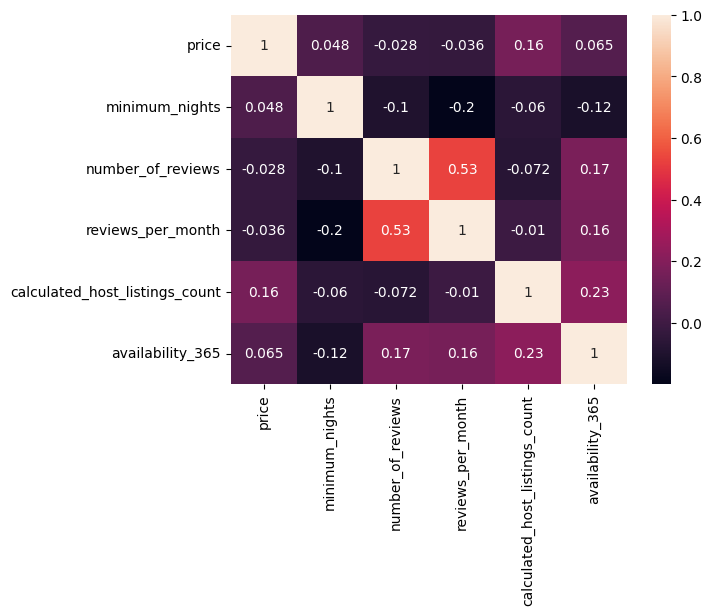

In [14]:
sns.heatmap(df3,annot=True)

<AxesSubplot: xlabel='availability_365', ylabel='neighbourhood_group'>

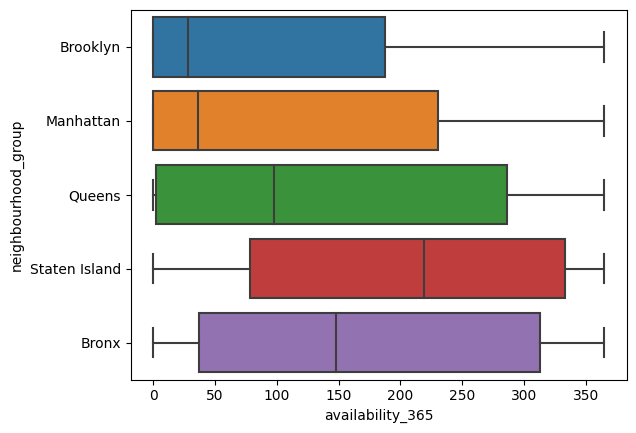

In [15]:
sns.boxplot(data=df,x=df['availability_365'],y=df['neighbourhood_group'])

<AxesSubplot: xlabel='price', ylabel='neighbourhood_group'>

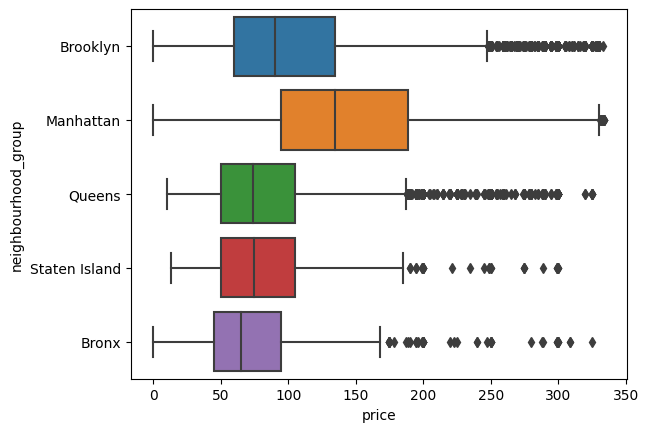

In [16]:
sns.boxplot(data=df,x=df['price'],y=df['neighbourhood_group'])

Text(0.5, 1.0, 'minimum_nights')

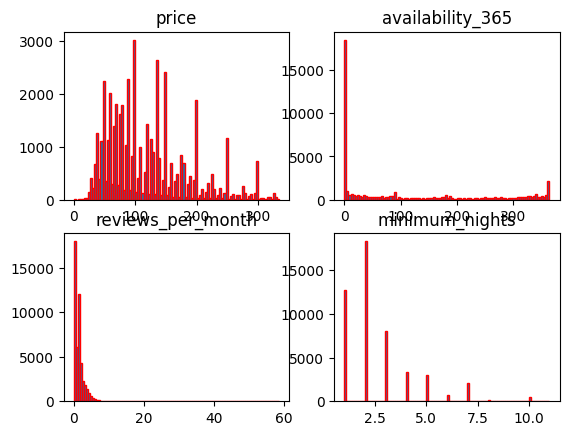

In [18]:

plt.figure()
plt.subplot(2,2,1)
plt.hist(df['price'],bins=100,edgecolor="r")
plt.title('price')
plt.subplot(2,2,2)
plt.hist(df['availability_365'],bins=100,edgecolor='r')
plt.title('availability_365')
plt.subplot(2,2,3)
plt.hist(df['reviews_per_month'],bins=100,edgecolor="r")
plt.title('reviews_per_month')
plt.subplot(2,2,4)
plt.hist(df['minimum_nights'],bins=100,edgecolor="r")
plt.title('minimum_nights')

In [19]:
###map
lat=np.mean(df['latitude'])
lon=np.mean(df['longitude'])

fig=px.density_mapbox(df,lat='latitude',lon='longitude',z='calculated_host_listings_count',center=dict(lat=lat,lon=lon),zoom=10,mapbox_style="carto_positron")
fig.show()

In [20]:
df4=pd.DataFrame(df['price'])
df4=df.join(df['minimum_nights'])
df4

ValueError: columns overlap but no suffix specified: Index(['minimum_nights'], dtype='object')

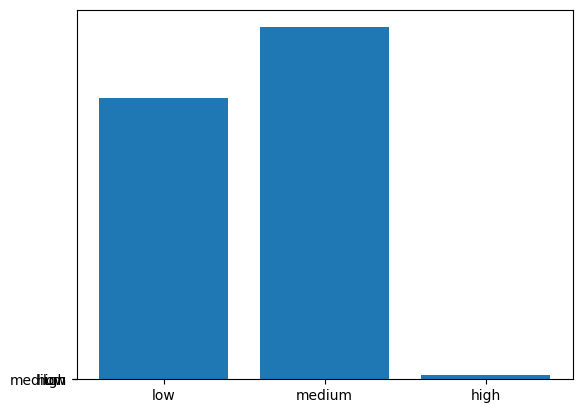

In [21]:
low=[]
medium=[]
high=[]
for i in df['minimum_nights']:
    if i<4:
        low.append(i)
    if i >= 4 or i <= 7:
        medium.append(i)
    if i > 8:
        high.append(i)
y=[len(low), len(medium), len(high)]
k=[0,1,2]
x=['low','medium','high']
plt.bar(x,y)
tick=plt.yticks(k,x)
#plt.title('')

<AxesSubplot: xlabel='availability_365', ylabel='room_type'>

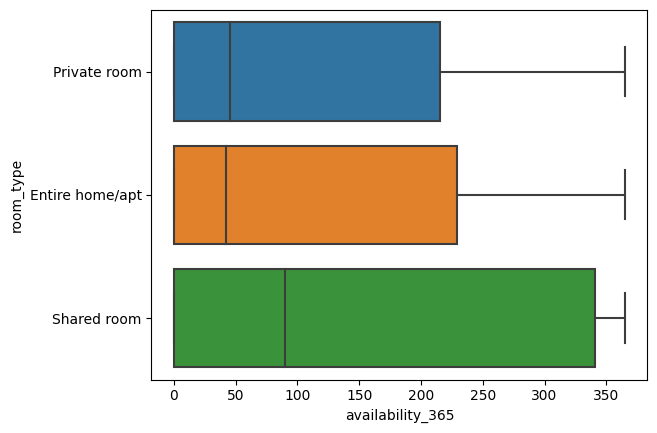

In [22]:
sns.boxplot(data=df,x=df['availability_365'],y=df['room_type'])

<AxesSubplot: xlabel='price', ylabel='room_type'>

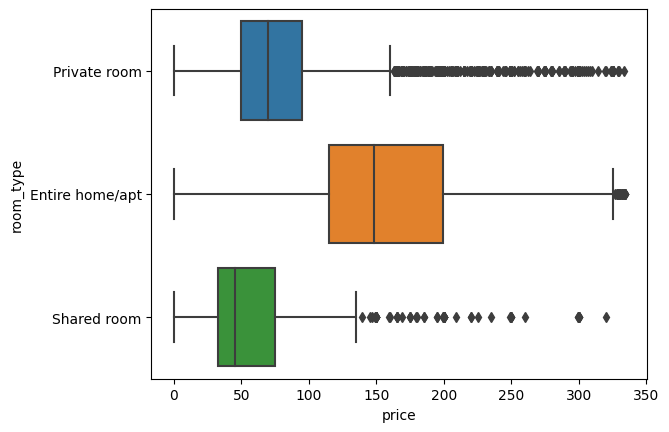

In [23]:
sns.boxplot(data=df,x=df['price'],y=df['room_type'])

<AxesSubplot: xlabel='minimum_nights', ylabel='neighbourhood_group'>

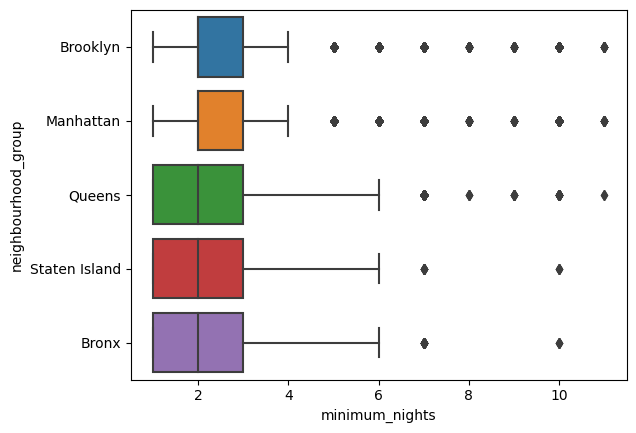

In [25]:
sns.boxplot(data=df,x=df['minimum_nights'],y=df['neighbourhood_group'])

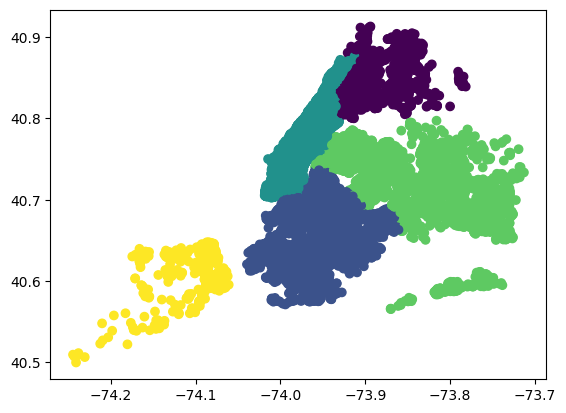

In [26]:
df['newcol']=df.neighbourhood_group.apply(['Bronx','Brooklyn','Manhattan','Queens','Staten Island'].index)
plt.scatter(x=df['longitude'],y=df['latitude'],c=df['newcol'])


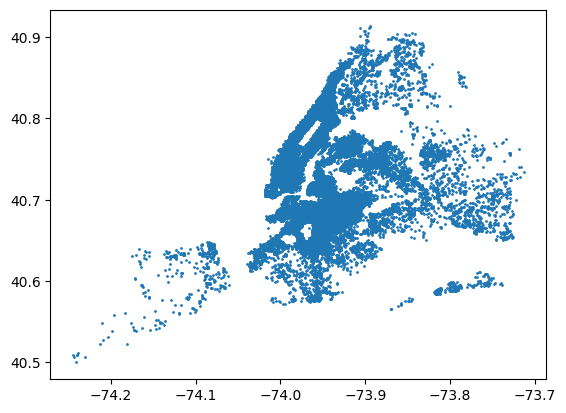

In [27]:
plt.scatter(x=df['longitude'],y=df['latitude'],s=1)

In [28]:
t=pd.crosstab(df['room_type'],df['neighbourhood_group'])
t

neighbourhood_group,Bronx,Brooklyn,Manhattan,Queens,Staten Island
room_type,,,,,
Entire home/apt,378,9553,13190,2096,176
Private room,652,10123,7973,3370,188
Shared room,59,413,480,198,9


<AxesSubplot: xlabel='room_type'>

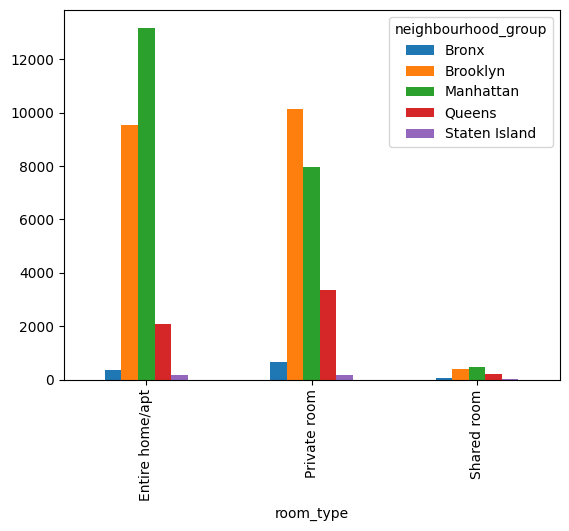

In [29]:
t.plot.bar()

In [30]:
e=pd.crosstab(df['neighbourhood'],df['room_type'])
e

room_type,Entire home/apt,Private room,Shared room
neighbourhood,,,
Allerton,16,26,0
Arden Heights,3,1,0
Arrochar,10,11,0
Arverne,48,27,2
Astoria,381,494,25
...,...,...,...
Windsor Terrace,115,42,0
Woodhaven,20,66,2
Woodlawn,4,6,1


In [31]:
df['host_id'].sort_values()

30604         2438
2290          2571
0             2787
21556         2787
10372         2787
           ...    
48875    274273284
48881    274298453
48884    274307600
48886    274311461
48888    274321313
Name: host_id, Length: 48858, dtype: int64

In [32]:
x=[]
for i in df['host_id']:
    if i==2787:
        x.append(i)
x

[2787, 2787, 2787, 2787, 2787, 2787]

In [33]:
df['host_id'].duplicated(keep=False)
#all duplicated values are true

0         True
1         True
2        False
3        False
4        False
         ...  
48890     True
48891     True
48892    False
48893     True
48894    False
Name: host_id, Length: 48858, dtype: bool

In [34]:
df[df.duplicated(subset=['host_name'])]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,newcol
22,8025,CBG Helps Haiti Room#2.5,22486,Lisel,Brooklyn,Park Slope,40.67989,-73.97798,Private room,80.0,1.0,39,0.370000,6,364,1
23,8110,CBG Helps Haiti Rm #2,22486,Lisel,Brooklyn,Park Slope,40.68001,-73.97865,Private room,110.0,2.0,71,0.610000,6,304,1
33,9783,back room/bunk beds,32294,Ssameer Or Trip,Manhattan,Harlem,40.82130,-73.95318,Private room,50.0,3.0,273,2.370000,3,359,2
35,10962,"Lovely room 2 & garden; Best area, Legal rental",9744,Laurie,Brooklyn,South Slope,40.66869,-73.98780,Private room,89.0,4.0,168,1.410000,3,340,1
39,12048,LowerEastSide apt share shortterm 1,7549,Ben,Manhattan,Lower East Side,40.71401,-73.98917,Shared room,40.0,1.0,214,1.810000,4,188,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48889,36484363,QUIT PRIVATE HOUSE,107716952,Michael,Queens,Jamaica,40.69137,-73.80844,Private room,65.0,1.0,0,1.941200,2,163,3
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70.0,2.0,0,1.283212,2,9,1
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40.0,4.0,0,1.283212,2,36,1
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55.0,1.0,0,1.272131,6,2,2


In [35]:
df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,newcol
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149.0,1.0,9,0.210000,6,365,1
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225.0,1.0,45,0.380000,2,355,2
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150.0,3.0,0,1.272131,1,365,2
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89.0,1.0,270,4.640000,1,194,1
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80.0,10.0,9,0.100000,1,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70.0,2.0,0,1.283212,2,9,1
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40.0,4.0,0,1.283212,2,36,1
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115.0,10.0,0,1.272131,1,27,2
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55.0,1.0,0,1.272131,6,2,2


Text(0.5, 1.0, 'calculated_host_listings_count')

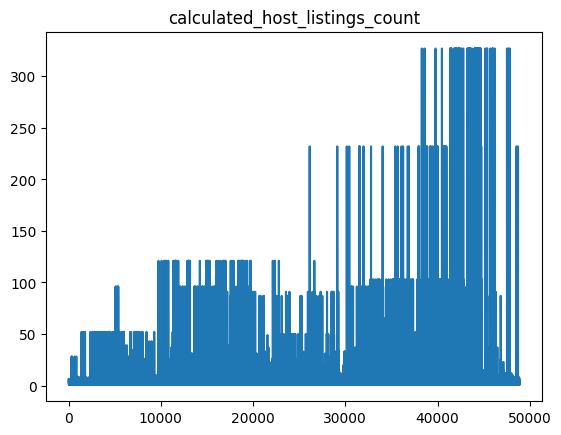

In [36]:
df['calculated_host_listings_count'].plot()
plt.title('calculated_host_listings_count')

In [37]:


for i in df['calculated_host_listings_count']:
    if i < 60:
        i=='low'
    elif i >= 60 or i <= 150:
        i=='med'
    else:
        i=='high'
        
df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,newcol
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149.0,1.0,9,0.210000,6,365,1
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225.0,1.0,45,0.380000,2,355,2
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150.0,3.0,0,1.272131,1,365,2
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89.0,1.0,270,4.640000,1,194,1
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80.0,10.0,9,0.100000,1,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70.0,2.0,0,1.283212,2,9,1
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40.0,4.0,0,1.283212,2,36,1
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115.0,10.0,0,1.272131,1,27,2
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55.0,1.0,0,1.272131,6,2,2


<AxesSubplot: xlabel='longitude', ylabel='latitude'>

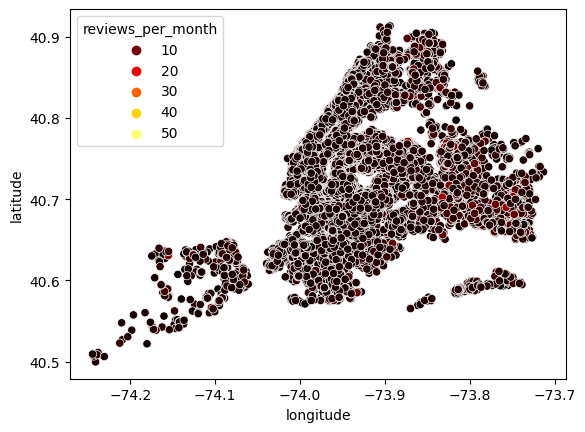

In [38]:
sns.scatterplot(data=df, x="longitude",y="latitude",hue="reviews_per_month",palette='hot')


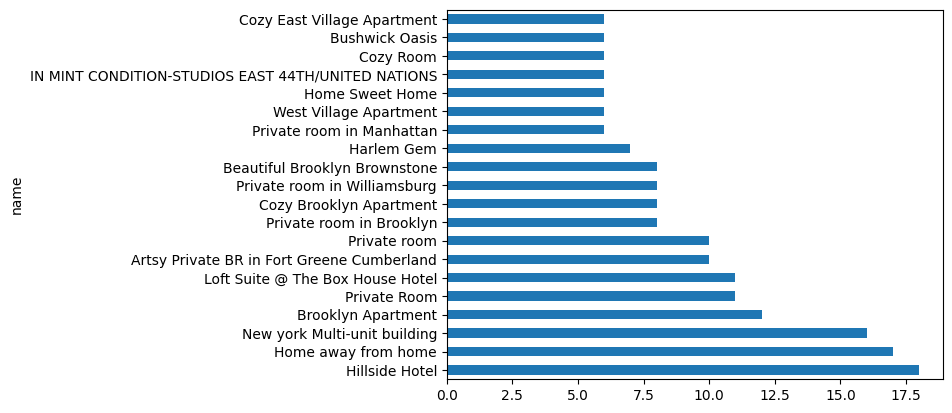

In [39]:
#plt.figure(figsize=(15,10))
hname = df.groupby("name")
hname.size().sort_values(ascending=False)[:20].plot.barh()
plt.show()

In [40]:
neigh = df.groupby("neighbourhood").size().sort_values(ascending=False)[:20]#.plot.barh(color='r')

<AxesSubplot: xlabel='longitude', ylabel='latitude'>

c:\users\amirsaqar\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



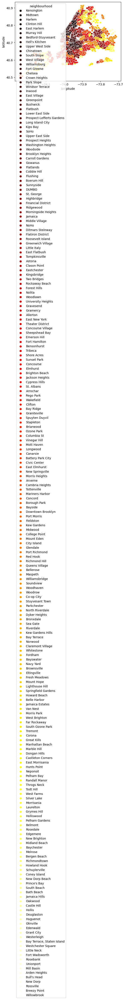

In [41]:
neigh =pd.Series(df.groupby("neighbourhood").size().sort_values(ascending=False)[:20])
sns.scatterplot(data=df, x="longitude",y="latitude",hue="neighbourhood",palette='hot')

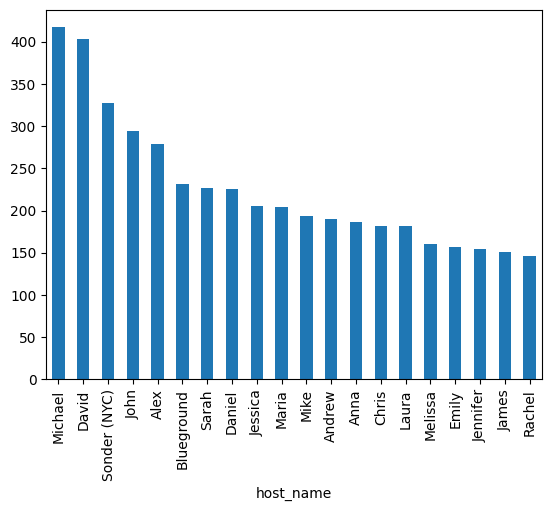

In [42]:
hname = df.groupby('host_name')
hname= hname.size().sort_values(ascending=False)[:20].plot.bar()


In [43]:
df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,newcol
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149.0,1.0,9,0.210000,6,365,1
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225.0,1.0,45,0.380000,2,355,2
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150.0,3.0,0,1.272131,1,365,2
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89.0,1.0,270,4.640000,1,194,1
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80.0,10.0,9,0.100000,1,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70.0,2.0,0,1.283212,2,9,1
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40.0,4.0,0,1.283212,2,36,1
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115.0,10.0,0,1.272131,1,27,2
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55.0,1.0,0,1.272131,6,2,2


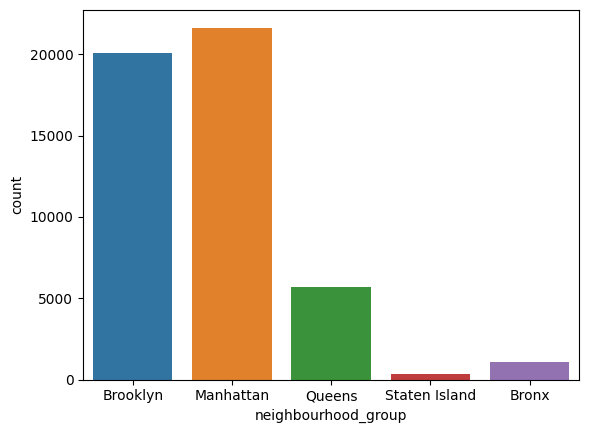

In [44]:
ax = sns.countplot(x=df["neighbourhood_group"] ) 

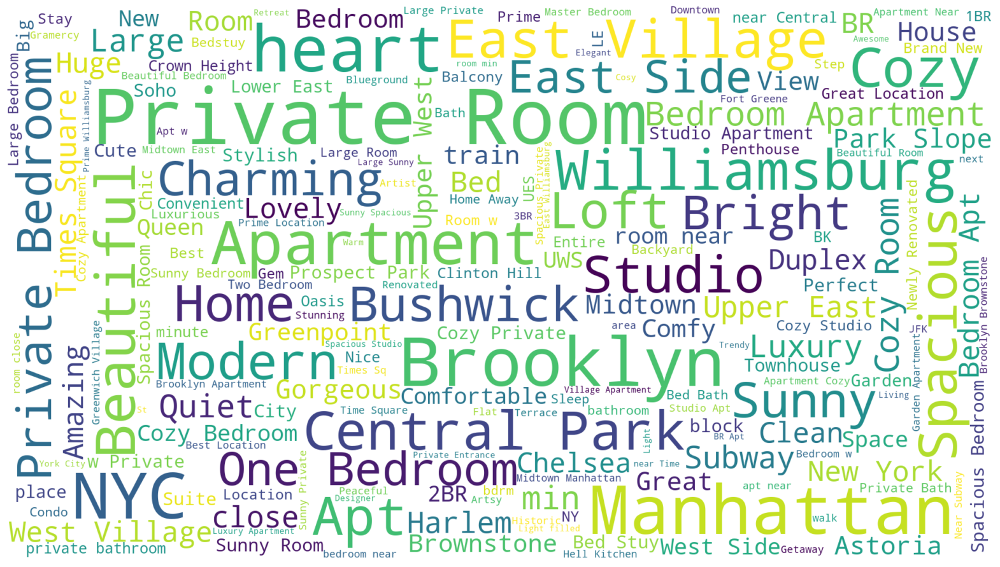

In [45]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

plt.subplots(figsize=(20,20))
wordcloud = WordCloud(max_font_size=150,max_words=200, background_color="white",height=1080, width=1920).generate(" ".join(df["name"]))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [46]:
###Q5
def is_normal(x, alpha=0.05):
    k2,p = stats.normaltest(x)
    return p > alpha
df = df.sample(frac=1)

In [47]:
manhattansample = df[df['neighbourhood_group'] == 'Manhattan'][:100]
print(is_normal(np.array(manhattansample['price'])))

True


In [48]:

stats.mannwhitneyu(manhattansample['price'],df['price'])

MannwhitneyuResult(statistic=3073689.5, pvalue=7.905401800318828e-06)

In [49]:
x1=manhattansample['price'].mean()
x2=df['price'].mean()
print('Manhattan price mean:' ,x1, ', population mean:',x2)

Manhattan price mean: 148.5 , population mean: 120.08670023332924


(array([ 3.,  5.,  3.,  6.,  7.,  7., 11., 14.,  6.,  4.,  9.,  1.,  3.,
         5.,  2.,  8.,  0.,  2.,  3.,  1.]),
 array([ 25.  ,  39.55,  54.1 ,  68.65,  83.2 ,  97.75, 112.3 , 126.85,
        141.4 , 155.95, 170.5 , 185.05, 199.6 , 214.15, 228.7 , 243.25,
        257.8 , 272.35, 286.9 , 301.45, 316.  ]),
 <BarContainer object of 20 artists>)

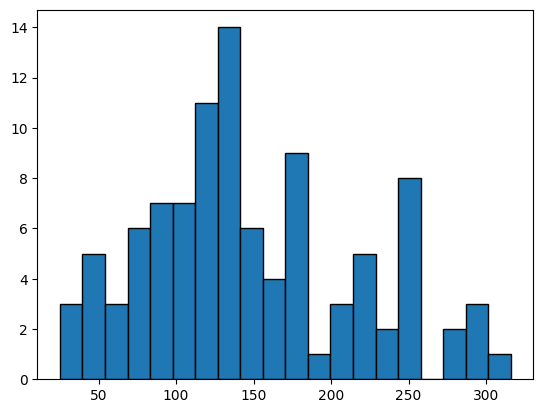

In [50]:
plt.hist(manhattansample['price'], bins=20, edgecolor='k')